**Homework 5 - ECE 60146 Deep Learning**  
**Mohit Pandiya**  
*mpandiy@purdue.edu*

## Importing Libraries

In [ ]:
import torch
from PIL import Image
import glob
import torchvision
import cv2
import random
import matplotlib.pyplot as plt
import torch.nn as nn
#from scipy.stats import wasserstein_distance`
import torch.nn.functional as F
import progressbar
from sklearn import metrics
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import pylab
import random
import requests
import os
import time
import json
import gc
from torchsummary import summary
#import pycuda.driver as cuda

## Downloads and make custom dataset from COCO dataset

In [ ]:
def download_from_coco(annFile, categories):
    #dataType=f'{train_or_val}2014'
    #annFile=f"../HW4/annotations/instances_{dataType}.json"

    coco=COCO(annFile)

    #categories = ['airplane', 'bus', 'cat', 'dog', 'pizza']
    image_annotations = []
    for category in categories:
        i=0
        start = time.time()
        catIds = coco.getCatIds(catNms=[category]);
        imgIds = coco.getImgIds(catIds=catIds );
        print(f"Number of images for {category}  = {len(imgIds)} \n")
        print(f"Selecting {len(imgIds)} {train_or_val} image\n")

        bar = progressbar.ProgressBar()
        #img_idxs = random.sample(imgIds, num)
        for img_idx in bar(range(len(imgIds))):
            #for img_idx in bar(range(len(img_idxs))):
            img = coco.loadImgs(imgIds[img_idx])[0]
            annId = coco.getAnnIds(imgIds = img['id'], catIds=catIds , iscrowd=False)
            anns = coco.loadAnns(annId)[0]

            #print(img)
            #img['coco_url']

            if anns['area'] > 40000:
                img_url = img['coco_url']
                image_annotation = {"img_id": img['id'] , 'ann_id' : annId , 'b_box' : anns['bbox'] ,
                                     "img_h" : img['height'],"img_w":img['width'], 'class':category}
                img_data = requests.get(img_url).content
                #img_data = c
                isExist = os.path.exists(f"{train_or_val}/{category}")
                if not isExist:
                   # Create a new directory because it does not exist
                   os.makedirs(f"{train_or_val}/{category}")
                with open(f'{train_or_val}/{category}/{img["id"]}.jpg', 'wb') as handler:
                    handler.write(img_data)
                    i=i+1
                image_annotations.append(image_annotation)

        end = time.time()
        print(f"Images for {category} downloaded in {round((end-start)/60 , 3)} minutes\n")
    with open(f'{train_or_val}_annotations.json', 'w') as fout:
        json.dump(image_annotations, fout)
    return image_annotations

In [ ]:
categories = ['bus', 'pizza', 'cat']
#annFile_loaction <- foe the 1st argument of the function pass the annotation file location for test and validationd datset
image_annotations_train = download_from_coco(annFile_loaction_train,categories)
image_annotations_val = download_from_coco(annFile_loaction_val,categories)

## Read the data set
- Custom data set class created  
> Number of Training Images 3836  
> Number of Testing Images 2005  
- Images read and then printed showig the bounding boxes  
*i forgot to resize them before saving so I resize them in the dataset class**

In [ ]:
class myDataset(torch.utils.data.Dataset):

    def __init__(self,root,img_annotations,class_str_to_num):
        """
        root : directory of the images
        """
        super().__init__()
        self.preprocess = torchvision.transforms.Compose([
        #tvt.ToPILImage(),
        torchvision.transforms.Resize((256,256)),
        torchvision.transforms.ToTensor(),
        #tvt.Normalize([0,0,0],[1,1,1])
        ])
        self.img_attr = img_annotations
        self.data = []
        #self.root = "/content/drive/MyDrive/Deep_Learning/HW5/"+ root
        self.root =  root
        #self.classes = classes
        #self.read_images()
        self.labels = nn.functional.one_hot(torch.arange(0, len(class_str_to_num)),num_classes=len(class_str_to_num))
        self.class_str_to_num = class_str_to_num

    def __len__(self):
        return len(self.img_attr)

    def __getitem__(self,index):
        image = Image.open(f"{self.root}/{self.img_attr[index]['class']}/{self.img_attr[index]['img_id']}.jpg")
        img_np =  np.array(image)
        flag=False
        if img_np.ndim == 2:
            #print(f"{index} : B & W")
            rgbimg = Image.new("RGB", image.size)
            rgbimg.paste(image)
            image = rgbimg
            #flag=True

        bbox = self.img_attr[index]['b_box']
        new_bbox = [bbox[0], bbox[1], bbox[0]+bbox[2], bbox[1]+bbox[3]]
        image,new_bbox = self.resize_image(image, new_bbox)

        #dividing by 256 becasue the image will be preprocessed and normalized so need to bring the value of bounding boxes between (0,1)
        new_bbox = [i/256.0 for i in new_bbox]
        new_bbox_tensor = torch.tensor(new_bbox, dtype=torch.float)

        image_tensor = self.preprocess(image).float()
        #if index%200==0 or flag:
        #    print(f"{index} : {image_tensor.shape}")
        return  image_tensor ,  self.labels[self.class_str_to_num[self.img_attr[index]['class']]] , new_bbox_tensor

    @staticmethod
    def resize_image(image,bbox,dim=256):
        w,h = image.size
        w_ratio = w / dim
        h_ratio = h/dim
        bbox[0] = bbox[0]/w_ratio
        bbox[1] = bbox[1]/h_ratio
        bbox[2] = bbox[2]/w_ratio
        bbox[3] = bbox[3]/h_ratio
        image = image.resize((dim,dim))
        return image, bbox

In [ ]:
#f = open('train_annotations.json')
#data = json.load(f)
#print(data[0])

In [ ]:
classes = ['bus', 'pizza', 'cat']
img_annotations_train = json.load(open('train_annotations.json'))
print(f"Number of Training Images {len(img_annotations_train)}")
img_annotations_val = json.load(open('val_annotations.json'))
print(f"Number of Testing Images {len(img_annotations_val)}")
i=0
class_map = {}
class_map_rev = {}
for clas in classes:
    class_map[clas]=i
    class_map_rev[i] = clas
    i=i+1
#print(class_map)
#print(class_map_rev)
dataloader_train = myDataset("train",img_annotations_train,class_map)
#print(len(dataloader_train))

dataloader_test = myDataset("val",img_annotations_val,class_map)
#print(len(dataloader_test))

#print(dataloader_test.data[0]["image"].shape)
#print(dataloader_train.data[0]["image"].shape)

loader = torch.utils.data.DataLoader(dataloader_train, batch_size=4,shuffle=True)
#print(len(loader.dataset))
#loader_test = torch.utils.data.DataLoader(dataloader_test, batch_size=1,shuffle=True)
#print(len(loader_test.dataset))


Number of Training Images 3836
Number of Testing Images 2005


Training Images


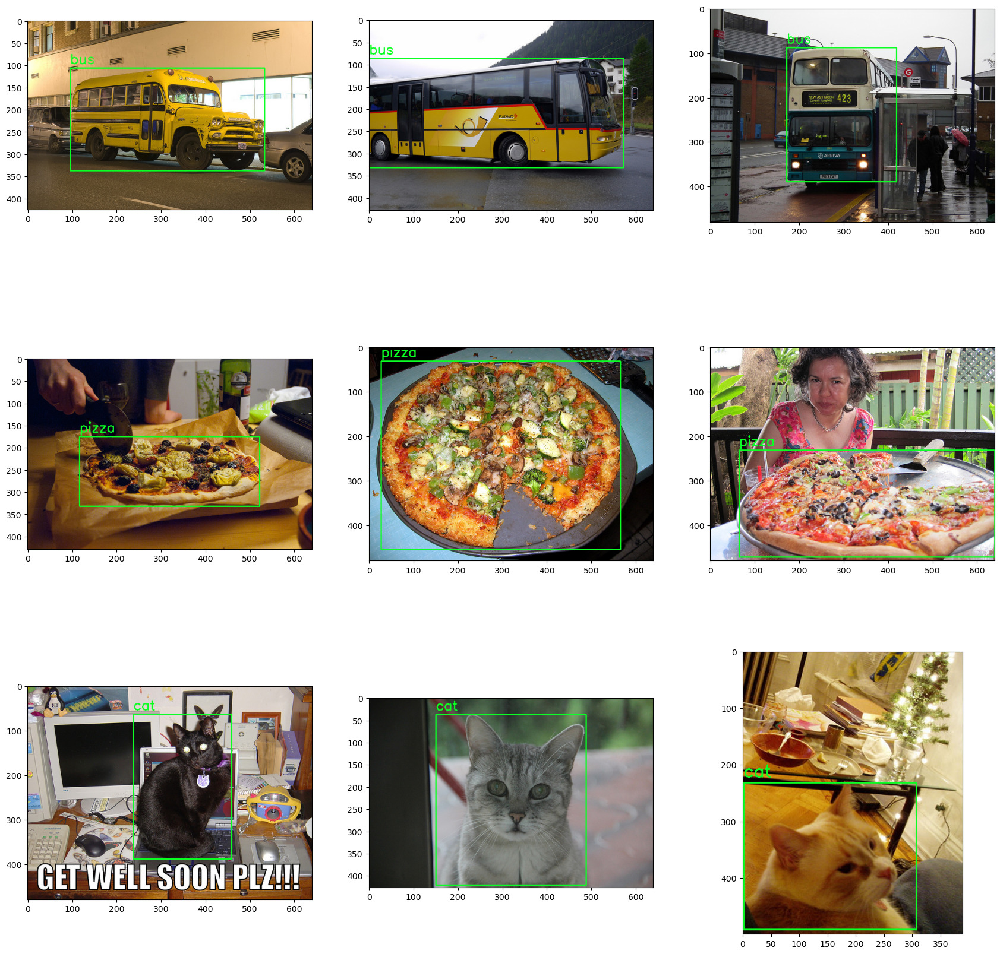

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(21, 21))
row = 0
for clas in classes:
    col = 0
    for item in img_annotations_train:
        if col==3:
            break
        if item['class'] == clas:
            image = cv2.imread(f'train/{clas}/{item["img_id"]}.jpg')
            #image = cv2.resize(image,(256,256))
            [x , y , w , h] = item['b_box']
            image = cv2.rectangle ( image , (int( x ) , int( y ) ) , (int( x + w ) , int ( y + h ) ) , ( 36 , 255 , 12 ) , 2 )
            image = cv2.putText ( image , clas , (int( x ) , int( y - 10 ) ) , cv2.FONT_HERSHEY_SIMPLEX , 1,( 36 , 255 , 12 ) , 2 )
            ax[row,col].imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
            col = col+1
    row = row+1
print("Training Images")
plt.show()

Validation Images


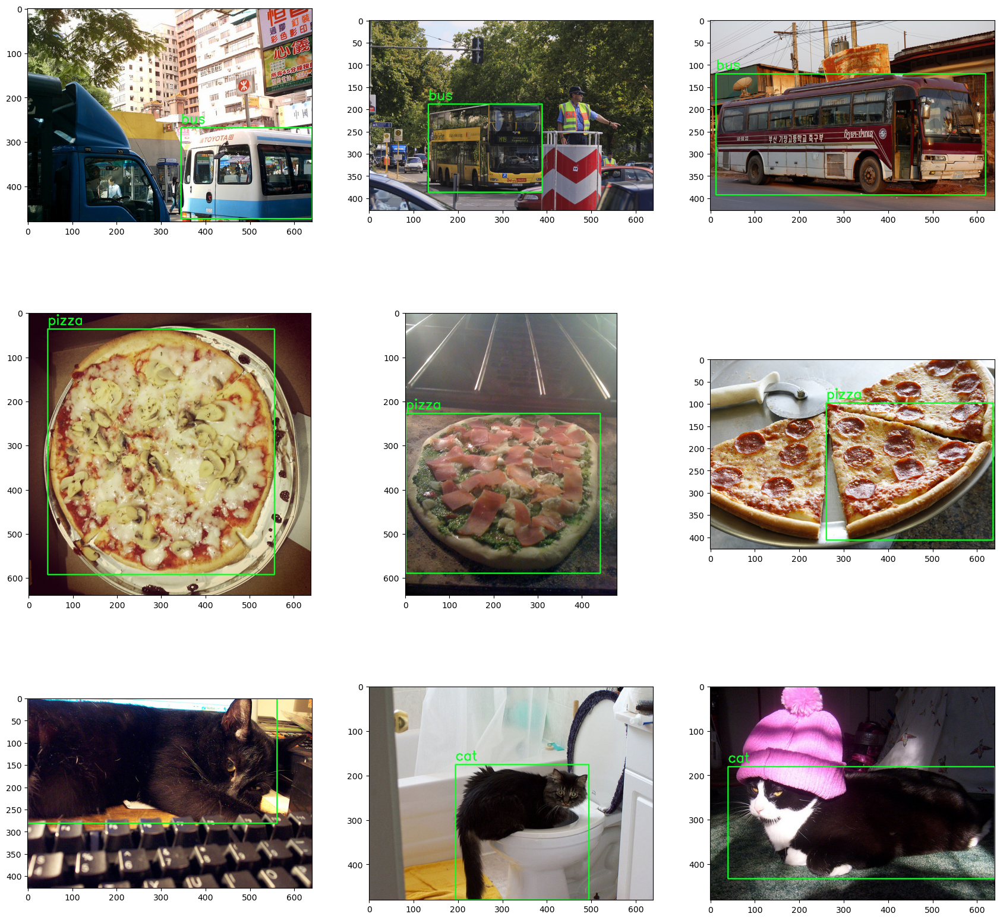

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(21, 21))
row = 0
for clas in classes:
    col = 0
    for item in img_annotations_val:
        if col==3:
            break
        if item['class'] == clas:
            image = cv2.imread(f'val/{clas}/{item["img_id"]}.jpg')
            #image = cv2.resize(image,(256,256))
            [x , y , w , h] = item['b_box']
            image = cv2.rectangle ( image , (int( x ) , int( y ) ) , (int( x + w ) , int ( y + h ) ) , ( 36 , 255 , 12 ) , 2 )
            image = cv2.putText ( image , clas , (int( x ) , int( y - 10 ) ) , cv2.FONT_HERSHEY_SIMPLEX , 1,( 36 , 255 , 12 ) , 2 )
            ax[row,col].imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
            col = col+1
    row = row+1
print("Validation Images")
plt.show()

## Creating the Residual block and the model

*Took inspiration from this youtube video(https://www.youtube.com/watch?v=JG_ODvnlgjY&t=803s) to make the residual block .. I did some changes to the block and the model*

**Number of learnable layes in the network = 66**

PFB the illustration of the model -


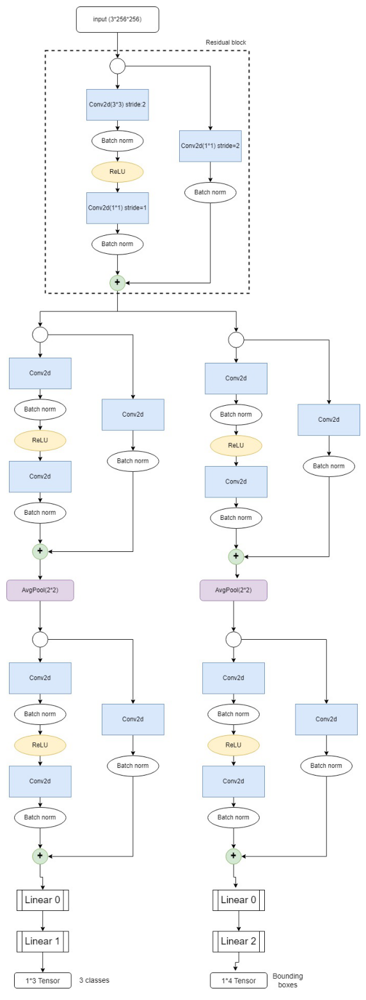

In [ ]:
image=cv2.imread("object_detect_locatize_CNN.jpg")
fig = plt.figure(figsize=(40,20))
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [ ]:
class ResidualBlock(torch.nn.Module):
    """ Helper Class"""
    #self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    def __init__(self, channels):
        self.channels = channels
        super(ResidualBlock, self).__init__()
        self.block = torch.nn.Sequential(
                torch.nn.Conv2d(in_channels=channels[0],
                                out_channels=channels[1],
                                kernel_size=(3, 3),
                                stride=(2, 2),
                                padding=1),
                torch.nn.BatchNorm2d(channels[1]),
                torch.nn.ReLU(inplace=True),
                torch.nn.Conv2d(in_channels=channels[1],
                                out_channels=channels[2],
                                kernel_size=(1, 1),
                                stride=(1, 1),
                                padding=0),
                torch.nn.BatchNorm2d(channels[2])
        )

        self.shortcut = torch.nn.Sequential(
                torch.nn.Conv2d(in_channels=channels[0],
                                out_channels=channels[2],
                                kernel_size=(1, 1),
                                stride=(2, 2),
                                padding=0),
                torch.nn.BatchNorm2d(channels[2])
        )

    def forward(self, x):

        debug = False
        shortcut = x
        if debug : print("---------------------------------------------")
        if debug : print(f"Size of input of Res_forward = {x.shape}")
        if x.shape[-1]%2==0:
          #weights = torch.tensor([[1., 0., 0.],
          #                        [0., 1., 0.],
          #                        [0., 0., 1.]])
          kernel_size=3
          #weights = torch.tensor([np.ones((kernel_size,kernel_size))])
          #weights = weights.view(1, 1, kernel_size, kernel_size).repeat(self.channels[2], self.channels[0] , 1, 1)
        else:
          kernel_size=5
          #weights = torch.tensor([np.ones((5,5))])
          #weights = weights.view(1, 1, 5, 5).repeat(self.channels[2], self.channels[0] , 1, 1)

        weights = torch.tensor([np.ones((kernel_size,kernel_size))])
        weights = weights.view(1, 1, kernel_size, kernel_size).repeat(self.channels[2], self.channels[0] , 1, 1)

        weights = weights.cuda()
        weights=weights.float()
        if debug : print(f"Size of weights = {weights.shape}")

        #shortcut b in_ch h w

        skip_connection = F.conv2d(shortcut, weights,  padding='valid', stride=2)
        #else:
        # skip_connection = F.conv2d(shortcut, weights, pading=1)

        if debug : print(f"Size of output of skip_connection = {skip_connection.shape}")

        block = self.block(x)
        if debug : print(f"Size of output of Res_forward_block = {block.shape}")


        shortcut = self.shortcut(x)
        if debug : print(f"Size of output of Res_forward_shortcut = {shortcut.shape}")
        #x = torch.nn.functional.relu(block+skip_connection)
        x = torch.nn.functional.relu(block+shortcut)
        #print(f"Size of output of Res_forward = {x.shape}")

        return x

In [ ]:
##########################
### MODEL
##########################

class ConvNet(torch.nn.Module):

    def __init__(self, num_classes, debug):
        super(ConvNet, self).__init__()
        self.debug = debug
        self.residual_block_1 = ResidualBlock(channels=[3, 8, 16])
        self.residual_block_2 = ResidualBlock(channels=[16 , 32, 64])
        self.residual_block_4 = ResidualBlock(channels=[64 , 128, 256])

        self.linear_0 = torch.nn.Linear(65536, 2048)
        #self.linear_1 = torch.nn.Linear(8192, 1024)
        #self.linear_2 = torch.nn.Linear(1024, 256)
        #self.linear_1 = torch.nn.Linear(65536, 256)

        self.linear_last_clf = torch.nn.Linear(2048, num_classes)

        self.residual_block_3 = ResidualBlock(channels=[16 , 32, 64])
        self.residual_block_5 = ResidualBlock(channels=[64 , 128, 256])

        self.linear_last_bbox = torch.nn.Linear(2048, 4)
        self.AvgPool = nn.AvgPool2d(2, 2)

    def forward(self, x):

        res_1_in_shape = x.shape
        out = self.residual_block_1(x)
        if self.debug : print(f"Residual_1\t\t{res_1_in_shape}\t\t{out.shape}")
        out_bbox = out
        res_2_in_shape = out.shape
        out = self.residual_block_2(out)
        if self.debug : print(f"Residual_2\t\t{res_2_in_shape}\t\t{out.shape}")


        maxPool_1_in_shape = out.shape
        out = self.AvgPool(out)
        if self.debug : print(f"AvgPool_2\t\t{maxPool_1_in_shape}\t\t{out.shape}")

        #Added 27-02
        res_4_in_shape = out.shape
        out = self.residual_block_4(out)
        if self.debug : print(f"Residual_4\t\t{res_4_in_shape}\t\t{out.shape}")

        out = out.view(out.shape [0], -1 )
        lin_0_in_shape = out.shape
        out = torch.nn.functional.relu(self.linear_0(out))
        if self.debug : print(f"Linear_0\t\t{lin_0_in_shape}\t\t{out.shape}")

        #out = torch.nn.functional.relu(self.linear_1(out))
        #out = torch.nn.functional.relu(self.linear_2(out))


        logits = self.linear_last_clf(out)
        if self.debug : print(f"Linear_1\t\t{512}\t\t{logits.shape}\n")

        res_3_in_shape=out_bbox.shape
        out_bbox = self.residual_block_3(out_bbox)
        if self.debug : print(f"Residual_3\t\t{res_3_in_shape}\t\t{out_bbox.shape}")

        maxPool_2_in_shape = out_bbox.shape
        out_bbox = self.AvgPool(out_bbox)
        if self.debug : print(f"AvgPool_2\t\t{maxPool_2_in_shape}\t\t{out.shape}")


        #Added 27-02
        res_5_in_shape=out_bbox.shape
        out_bbox = self.residual_block_5(out_bbox)
        if self.debug : print(f"Residual_5\t\t{res_5_in_shape}\t\t{out_bbox.shape}")

        out_bbox = out_bbox.view(out_bbox.shape [0], -1 )
        lin_0_in_shape = out_bbox.shape

        out_bbox = torch.nn.functional.relu(self.linear_0(out_bbox))
        if self.debug : print(f"Linear_0\t\t{lin_0_in_shape}\t\t{out_bbox.shape}")

        #out_bbox = torch.nn.functional.relu(self.linear_1(out_bbox))
        #out_bbox = torch.nn.functional.relu(self.linear_2(out_bbox))


        bbox = self.linear_last_bbox(out_bbox)

        if self.debug : print(f"Linear_2\t\t{512}\t\t{bbox.shape}\n")

        return logits, bbox

In [ ]:
torch.cuda.empty_cache()
torch.cuda.memory_summary(device=None, abbreviated=False)
cuda.init()
print(f"GPU Device available = {cuda.Device(0).name()}")
print(torch.cuda.is_available())

GPU Device available = NVIDIA GeForce RTX 2060 with Max-Q Design
True


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


## Util functions
- Training function
- Evaluation function
- Print images with true and prediction label and bounding boxes

In [ ]:
def train_model(model , optimizer, loader, loss1, loss2,epochs, loss_IoU=False , debug=False):
    loss_through_epochs_clf = []
    loss_through_epochs_bbox = []
    for epoch in range( epochs ):
        running_loss_classification = 0.0
        running_loss_bbox = 0.0
        loss_in_epoch_clf = []
        loss_in_epoch_bbox = []
        with progressbar.ProgressBar(max_value=len(loader)) as bar:
            for i , data in enumerate(loader):
                inputs, labels, bbox_true = data
                inputs = inputs.to( device )
                labels = labels.type(torch.DoubleTensor)
                labels = labels.to( device )
                #bbox_true = bbox_true.type(torch.DoubleTensor)
                bbox_true = bbox_true.to(device)

                optimizer.zero_grad()
                if debug : print(f"Input size iteration {i}: {inputs.shape}\n")
                outputs_c , outputs_b = model(inputs)
                if debug : print(f"\nOutput size iteration {i} of classififcation : {outputs_c.shape}")
                if debug : print(f"Output size iteration {i} of true labels : {labels.shape}")
                if debug : print(f"Output size iteration {i} of bbox : {outputs_b.shape}")

                loss_classification = loss1( outputs_c , labels )
                if loss_IoU:
                    loss_bbox =  torchvision.ops.complete_box_iou_loss(outputs_b,bbox_true,reduction='mean')
                else:
                    loss_bbox = loss2(outputs_b, bbox_true)

                loss_classification.backward(retain_graph=True)
                loss_bbox.backward()

                optimizer.step()

                #running_loss += loss.item()
                running_loss_classification += loss_classification.item()
                running_loss_bbox += loss_bbox.item()

                if(i+1)% 100 == 0:
                    #print(f"[ epoch : {epoch + 1}, batch : {i + 1}] loss_clf : {round(running_loss_classification/100,3)} loss_bbox : {round(running_loss_bbox/100,3)}")
                    loss_in_epoch_clf.append(running_loss_classification/100)
                    loss_in_epoch_bbox.append(running_loss_bbox/100)
                    running_loss_classification = 0.0
                    running_loss_bbox = 0.0
                bar.update(i)
        print(f"Epoch {epoch+1} | Loss clf: {loss_in_epoch_clf[-1]} | Loss bbox: {loss_in_epoch_bbox[-1]}" )
        loss_through_epochs_clf.append(loss_in_epoch_clf)
        loss_through_epochs_bbox.append(loss_in_epoch_bbox)

        del inputs
        del labels
        del bbox_true
        del outputs_c
        del outputs_b
        gc.collect()

    return loss_through_epochs_clf, loss_through_epochs_bbox


def check_accuracy(model:nn.Module, test_loader, device, classes):
    num_correct = 0
    total = 0
    model.eval()
    preds_cf = []
    labels_cf = []
    all_iou = 0.0
    with torch.no_grad():
        for data, labels, bbox in test_loader:
            data = data.to(device=device)
            labels = labels.to(device=device)
            bbox = bbox.to(device=device)

            predictions, bbox_pred= model(data)

            predictions = [[1 if max(i)==j else 0 for j in i ] for i in predictions]
            pred_cf = class_map_rev[predictions[0].index(max(predictions[0]))]
            #print(pred_cf)
            preds_cf.append(pred_cf)
            #predictions = predictions.to(device=device)

            labels = labels.tolist()
            label_cf = class_map_rev[labels[0].index(max(labels[0]))]
            #print(f"label = {label_cf}")
            labels_cf.append(label_cf)

            #print(labels)
            #print(predictions == labels)
            #num_correct += (predictions == labels).sum()
            if predictions == labels:
                num_correct += 1
            #total += labels.size(0)
            total += 1
            #if total==1000:
            #    print(num_correct/total)
            #print(bbox_pred.tolist()[0])
            #print(bbox)

            #iou = calculate_iou(bbox[0],bbox_pred[0])
            iou = torchvision.ops.complete_box_iou(bbox,bbox_pred)

            all_iou = all_iou+iou

        #total = len(loader_test.dataset)
        accuracy = float(num_correct)/float(total)*100
        iou_accuracy = all_iou/float(total)
        print(f"Test Accuracy of the classification model: {accuracy:.2f} | regression model: {iou_accuracy}")
        return accuracy, iou_accuracy, labels_cf , preds_cf

def check_show_image(model):
    loader_test = torch.utils.data.DataLoader(dataloader_test, batch_size=1,shuffle=True)
    print(len(loader_test.dataset))

    def make_rec(image,bbox,class_label,color):
      [x , y , w , h] = bbox
      color = color
      image = cv2.rectangle ( image , (int( x ) , int( y ) ) , (int( w ) , int ( h ) ) , color , 2 )
      image = cv2.putText ( image , class_label , (int( x ) , int( y + 10 ) ) , cv2.FONT_HERSHEY_SIMPLEX , 0.5, color , 1 )
      return image

    count = 0
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(21, 7))
    for test_images, test_labels , test_bbox in loader_test:
        if count==3:
          break
        sample_image = np.array(test_images[0].permute(1, 2, 0)).copy()
        true_label = test_labels[0].tolist()
        true_cf = class_map_rev[true_label.index(max(true_label))]

        true_bbox = test_bbox[0].tolist()
        true_bbox = [int(i*255) for i in true_bbox]
        image = make_rec(sample_image,true_bbox,"true_"+true_cf,(0,1,0))

        image_input = test_images.to(device)

        predictions, bbox_pred= net1(image_input)
        bbox_pred = bbox_pred[0].tolist()
        predictions = [[1 if max(i)==j else 0 for j in i ] for i in predictions]
        pred_cf = class_map_rev[predictions[0].index(max(predictions[0]))]

        bbox_pred = [i*255 for i in bbox_pred]

        image = make_rec(image,bbox_pred,"pred_"+pred_cf,(1,1,0))
        ax[count].set_title(f"True label:{true_cf} Pred label:{pred_cf}")
        ax[count].imshow((image*255).astype('uint8'))

        #print('---------------------')
        count = count+1
    plt.show()

## Training with MSE Loss for classification

In [ ]:
loader = torch.utils.data.DataLoader(dataloader_train, batch_size=16,shuffle=True)
print(len(loader.dataset))

debug= False
net1 = ConvNet(num_classes=3,debug=debug)
net1 = net1.to( device )
print("~~~~~~~~~~~~~~~~~ Summary of Net1 ~~~~~~~~~~~~~~~~~~")
summary(net1, (3, 256, 256))

criterion_classification = torch.nn.CrossEntropyLoss()
#criterion_regression = torchvision.ops.generalized_box_iou()
criterion_regression = nn.MSELoss()
epochs = 15
optimizer = torch.optim.Adam(net1.parameters(), lr=1e-3 , betas =( 0.9 , 0.99 ))
loss_through_epochs_clf_net1, loss_through_epochs_bbox_net1 = train_model(net1 , optimizer, loader, criterion_classification, criterion_regression, epochs)

3836
~~~~~~~~~~~~~~~~~ Summary of Net1 ~~~~~~~~~~~~~~~~~~
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 128, 128]             224
       BatchNorm2d-2          [-1, 8, 128, 128]              16
              ReLU-3          [-1, 8, 128, 128]               0
            Conv2d-4         [-1, 16, 128, 128]             144
       BatchNorm2d-5         [-1, 16, 128, 128]              32
            Conv2d-6         [-1, 16, 128, 128]              64
       BatchNorm2d-7         [-1, 16, 128, 128]              32
     ResidualBlock-8         [-1, 16, 128, 128]               0
            Conv2d-9           [-1, 32, 64, 64]           4,640
      BatchNorm2d-10           [-1, 32, 64, 64]              64
             ReLU-11           [-1, 32, 64, 64]               0
           Conv2d-12           [-1, 64, 64, 64]           2,112
      BatchNorm2d-13           [-1, 64, 64, 6

100% (240 of 240) |######################| Elapsed Time: 0:03:57 Time:  0:03:57


Epoch 1 | Loss clf: 0.4169486137653758 | Loss bbox: 0.04381658311933279


100% (240 of 240) |######################| Elapsed Time: 0:03:50 Time:  0:03:50


Epoch 2 | Loss clf: 0.41995909226982425 | Loss bbox: 0.05001115132123232


100% (240 of 240) |######################| Elapsed Time: 0:03:48 Time:  0:03:48


Epoch 3 | Loss clf: 0.2870068447004178 | Loss bbox: 0.06226156618446112


100% (240 of 240) |######################| Elapsed Time: 0:03:48 Time:  0:03:48


Epoch 4 | Loss clf: 0.22243088601866692 | Loss bbox: 0.03290613686665893


100% (240 of 240) |######################| Elapsed Time: 0:03:52 Time:  0:03:52


Epoch 5 | Loss clf: 0.13700707414556118 | Loss bbox: 0.0201613612100482


100% (240 of 240) |######################| Elapsed Time: 0:03:53 Time:  0:03:53


Epoch 6 | Loss clf: 0.10419247997919769 | Loss bbox: 0.01913819316774607


100% (240 of 240) |######################| Elapsed Time: 0:03:52 Time:  0:03:52


Epoch 7 | Loss clf: 0.06769522712820955 | Loss bbox: 0.017484723143279552


100% (240 of 240) |######################| Elapsed Time: 0:03:52 Time:  0:03:52


Epoch 8 | Loss clf: 0.08846150524157666 | Loss bbox: 0.017001034542918205


100% (240 of 240) |######################| Elapsed Time: 0:03:53 Time:  0:03:53


Epoch 9 | Loss clf: 0.051934405016607704 | Loss bbox: 0.015621919967234135


100% (240 of 240) |######################| Elapsed Time: 0:03:52 Time:  0:03:52


Epoch 10 | Loss clf: 0.0578491319467755 | Loss bbox: 0.01373169558122754


100% (240 of 240) |######################| Elapsed Time: 0:03:49 Time:  0:03:49


Epoch 11 | Loss clf: 0.03158280664359767 | Loss bbox: 0.013942433083429932


100% (240 of 240) |######################| Elapsed Time: 0:03:50 Time:  0:03:50


Epoch 12 | Loss clf: 0.09433145721759562 | Loss bbox: 0.013633315190672875


100% (240 of 240) |######################| Elapsed Time: 0:03:50 Time:  0:03:50


Epoch 13 | Loss clf: 0.0353466718394354 | Loss bbox: 0.010533309536986052


100% (240 of 240) |######################| Elapsed Time: 0:03:48 Time:  0:03:48


Epoch 14 | Loss clf: 0.016618204347236185 | Loss bbox: 0.009720842647366225


100% (240 of 240) |######################| Elapsed Time: 0:03:47 Time:  0:03:47


Epoch 15 | Loss clf: 0.02131432666330291 | Loss bbox: 0.009193124705925584


In [ ]:
print(f"Number of learnable layes in the network = {len(list(net1.parameters()))}")


Number of learnable layes in the network = 66


## Evaluation of network of MSE Loss

- Test Accuracy of the classification model: **86.93** | regression model(average IoU) : **0.5005**

In [ ]:
#net1 = torch.load('CNN1_big_MSELoss')
loader_test = torch.utils.data.DataLoader(dataloader_test, batch_size=1,shuffle=True)
accuracy_net1 , iou_accuracy, labels_cf_net1 , preds_cf_net1 = check_accuracy(net1, loader_test,device,classes)

Test Accuracy of the classification model: 86.93 | regression model: tensor([[0.5005]], device='cuda:0')


2005


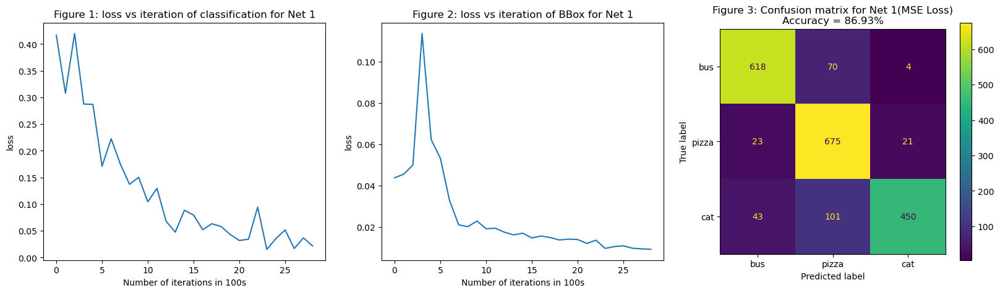

In [ ]:
#loss_through_epochs_clf_net1, loss_through_epochs_bbox_net1

#all_together_bbox_net1 = np.load('all_together_bbox_net1.npy')
#all_together_clf_net1 = np.load('all_together_clf_net1.npy')
figure_num=1


fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
low = 0
all_together_clf_net1=[]
for i in range(len(loss_through_epochs_clf_net1)):
    high = low+len(loss_through_epochs_clf_net1[i])
    #ax[0].plot(range(low,high),loss_through_epochs_clf_net1[i],label=f"epoch {i+1}")
    low = low+len(loss_through_epochs_clf_net1[i])
    all_together_clf_net1.extend(loss_through_epochs_clf_net1[i])


ax[0].plot(all_together_clf_net1[1:],label="all together")
ax[0].set_xlabel("Number of iterations in 100s")
ax[0].set_ylabel("loss")
ax[0].set_title(f"Figure {figure_num}: loss vs iteration of classification for Net 1")
#ax[0].legend()
figure_num+=1

low = 0
all_together_bbox_net1=[]
for i in range(len(loss_through_epochs_bbox_net1)):
    #print(f"epoch {i+1}")
    high = low+len(loss_through_epochs_bbox_net1[i])
    #print(f"start = {low} and end={high}")
    #ax[1].plot(range(low,high),loss_through_epochs_bbox_net1[i],label=f"epoch {i+1}")
    low = low+len(loss_through_epochs_bbox_net1[i])
    all_together_bbox_net1.extend(loss_through_epochs_bbox_net1[i])

ax[1].plot(all_together_bbox_net1[1:],label="all together")
ax[1].set_xlabel("Number of iterations in 100s")
ax[1].set_ylabel("loss")
ax[1].set_title(f"Figure {figure_num}: loss vs iteration of BBox for Net 1")
#ax[1].legend()
#plt.show()
figure_num+=1
#print(classes)

loader_test = torch.utils.data.DataLoader(dataloader_test, batch_size=1,shuffle=True)
print(len(loader_test.dataset))


confusion_matrix = metrics.confusion_matrix(labels_cf_net1, preds_cf_net1)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix,display_labels=classes)

cm_display.plot(ax=ax[2])
plt.title(f"Figure {figure_num}: Confusion matrix for Net 1(MSE Loss)\nAccuracy = {round(accuracy_net1,2)}%")
figure_num+=1
plt.show()


#np.save("all_together_clf_net1.npy",all_together_clf_net1)
#np.save("all_together_bbox_net1.npy",all_together_bbox_net1)
#torch.save(net1 , 'CNN1_big_MSELoss')


2005


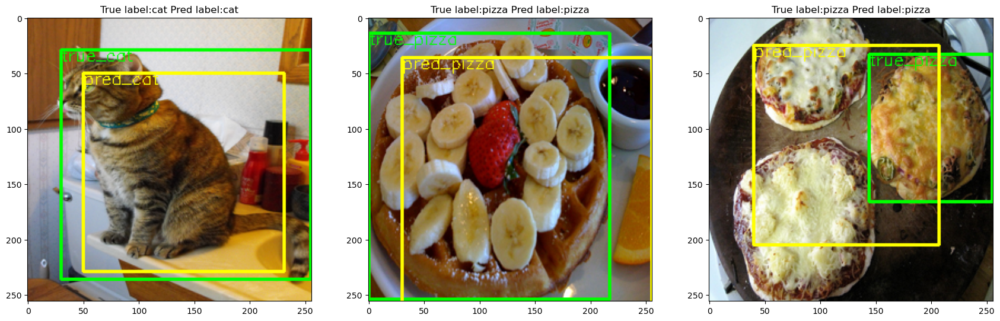

In [ ]:
check_show_image(net1)

In [ ]:
np.save("all_together_clf_net1.npy",all_together_clf_net1)
np.save("all_together_bbox_net1.npy",all_together_bbox_net1)
torch.save(net1 , 'CNN1_big_MSELoss')


## Training with Complete IoU Loss for classification

In [ ]:

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
loader = torch.utils.data.DataLoader(dataloader_train, batch_size=16,shuffle=True)
print(len(loader.dataset))

#model.to(device)
#optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

#Net1 of the homework
torch.cuda.empty_cache()

debug= False
net2 = ConvNet(num_classes=3,debug=debug)
net2 = net2.to( device )


print("~~~~~~~~~~~~~~~~~ Summary of Net1 ~~~~~~~~~~~~~~~~~~")
summary(net2, input_size=(3, 256, 256), batch_size=64, device='cuda')

#criterion_regression = torchvision.ops.generalized_box_iou()
#criterion_regression = torchvision.ops.complete_box_iou_loss()

criterion_classification = torch.nn.CrossEntropyLoss()
#optimizer = torch.optim.Adam(net2.parameters(), lr=1e-3 , betas =( 0.9 , 0.99 ))
optimizer = torch.optim.SGD(net2.parameters(), lr=0.0009)
#criterion_bbox = torchvision.ops.complete_box_iou_loss()

epochs=15
loss_through_epochs_clf_net2, loss_through_epochs_bbox_net2 = train_model(net2 , optimizer, loader, criterion_classification, None, epochs , loss_IoU=True)

3836
~~~~~~~~~~~~~~~~~ Summary of Net1 ~~~~~~~~~~~~~~~~~~
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [64, 8, 128, 128]             224
       BatchNorm2d-2          [64, 8, 128, 128]              16
              ReLU-3          [64, 8, 128, 128]               0
            Conv2d-4         [64, 16, 128, 128]             144
       BatchNorm2d-5         [64, 16, 128, 128]              32
            Conv2d-6         [64, 16, 128, 128]              64
       BatchNorm2d-7         [64, 16, 128, 128]              32
     ResidualBlock-8         [64, 16, 128, 128]               0
            Conv2d-9           [64, 32, 64, 64]           4,640
      BatchNorm2d-10           [64, 32, 64, 64]              64
             ReLU-11           [64, 32, 64, 64]               0
           Conv2d-12           [64, 64, 64, 64]           2,112
      BatchNorm2d-13           [64, 64, 64, 6

100% (240 of 240) |######################| Elapsed Time: 0:01:31 Time:  0:01:31


Epoch 1 | Loss clf: 0.7782393219915684 | Loss bbox: 0.5923482504487038


100% (240 of 240) |######################| Elapsed Time: 0:01:09 Time:  0:01:09


Epoch 2 | Loss clf: 0.6026872778922552 | Loss bbox: 0.5399804282188415


100% (240 of 240) |######################| Elapsed Time: 0:01:09 Time:  0:01:09


Epoch 3 | Loss clf: 0.5408821297452232 | Loss bbox: 0.5098112899065018


100% (240 of 240) |######################| Elapsed Time: 0:01:10 Time:  0:01:10


Epoch 4 | Loss clf: 0.49219619118612173 | Loss bbox: 0.49214379012584686


100% (240 of 240) |######################| Elapsed Time: 0:01:14 Time:  0:01:14


Epoch 5 | Loss clf: 0.44195525906032346 | Loss bbox: 0.4634812730550766


100% (240 of 240) |######################| Elapsed Time: 0:02:28 Time:  0:02:28


Epoch 6 | Loss clf: 0.4110450469535499 | Loss bbox: 0.44947372525930407


100% (240 of 240) |######################| Elapsed Time: 0:02:34 Time:  0:02:34


Epoch 7 | Loss clf: 0.4021904384034133 | Loss bbox: 0.4294984459877014


100% (240 of 240) |######################| Elapsed Time: 0:02:35 Time:  0:02:35


Epoch 8 | Loss clf: 0.3757502848719014 | Loss bbox: 0.4110336765646935


100% (240 of 240) |######################| Elapsed Time: 0:02:34 Time:  0:02:34


Epoch 9 | Loss clf: 0.35231363564512774 | Loss bbox: 0.3980111652612686


100% (240 of 240) |######################| Elapsed Time: 0:02:34 Time:  0:02:34


Epoch 10 | Loss clf: 0.3413254217167696 | Loss bbox: 0.38393465042114255


100% (240 of 240) |######################| Elapsed Time: 0:02:34 Time:  0:02:34


Epoch 11 | Loss clf: 0.32266707981473247 | Loss bbox: 0.3816773101687431


100% (240 of 240) |######################| Elapsed Time: 0:02:34 Time:  0:02:34


Epoch 12 | Loss clf: 0.28750372462615587 | Loss bbox: 0.3683729180693626


100% (240 of 240) |######################| Elapsed Time: 0:02:35 Time:  0:02:35


Epoch 13 | Loss clf: 0.30308144832634754 | Loss bbox: 0.3620301866531372


100% (240 of 240) |######################| Elapsed Time: 0:02:34 Time:  0:02:34


Epoch 14 | Loss clf: 0.28649429323250386 | Loss bbox: 0.35393930569291115


100% (240 of 240) |######################| Elapsed Time: 0:02:34 Time:  0:02:34


Epoch 15 | Loss clf: 0.2852005440253379 | Loss bbox: 0.3466862362623215


## Evaluation of model with CIoU loss

- Test Accuracy of the classification model: *86.33* | regression model: **0.4639**

In [ ]:
accuracy_net2 , iou_accuracy2, labels_cf_net2 , preds_cf_net2 = check_accuracy(net2, loader_test,device,classes)

Test Accuracy of the classification model: 86.33 | regression model: tensor([[0.4639]], device='cuda:0')


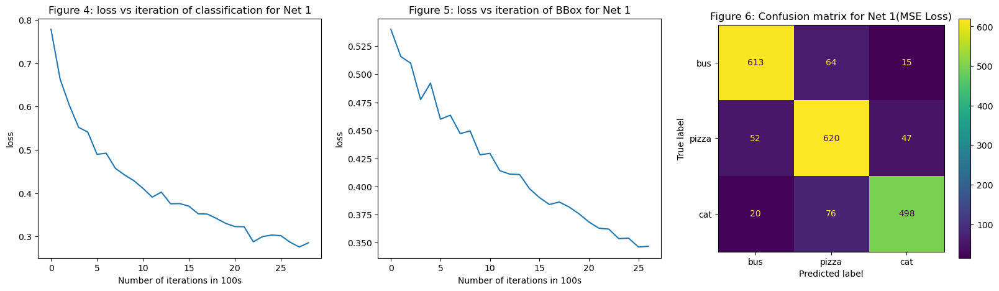

In [ ]:

#loss_through_epochs_clf_net2, loss_through_epochs_bbox_net2
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
low = 0
all_together_clf_net2=[]
for i in range(len(loss_through_epochs_clf_net2)):
    high = low+len(loss_through_epochs_clf_net2[i])
    #ax[0].plot(range(low,high),loss_through_epochs_clf_net1[i],label=f"epoch {i+1}")
    low = low+len(loss_through_epochs_clf_net2[i])
    all_together_clf_net2.extend(loss_through_epochs_clf_net2[i])


ax[0].plot(all_together_clf_net2[1:],label="all together")
ax[0].set_xlabel("Number of iterations in 100s")
ax[0].set_ylabel("loss")
ax[0].set_title(f"Figure {figure_num}: loss vs iteration of classification for Net 1")
#ax[0].legend()
figure_num+=1

low = 0
all_together_bbox_net2=[]
for i in range(len(loss_through_epochs_bbox_net2)):
    #print(f"epoch {i+1}")
    high = low+len(loss_through_epochs_bbox_net2[i])
    #print(f"start = {low} and end={high}")
    if i==0:
        continue
    #ax[1].plot(range(low,high),loss_through_epochs_bbox_net1[i],label=f"epoch {i+1}")
    low = low+len(loss_through_epochs_bbox_net2[i])
    all_together_bbox_net2.extend(loss_through_epochs_bbox_net2[i])

ax[1].plot(all_together_bbox_net2[1:],label="all together")
ax[1].set_xlabel("Number of iterations in 100s")
ax[1].set_ylabel("loss")
ax[1].set_title(f"Figure {figure_num}: loss vs iteration of BBox for Net 1")
#ax[1].legend()
#plt.show()
figure_num+=1
#print(classes)

confusion_matrix = metrics.confusion_matrix(labels_cf_net2, preds_cf_net2)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix,display_labels=classes)

cm_display.plot(ax=ax[2])
plt.title(f"Figure {figure_num}: Confusion matrix for Net 1(MSE Loss)")
figure_num+=1
plt.show()


2005


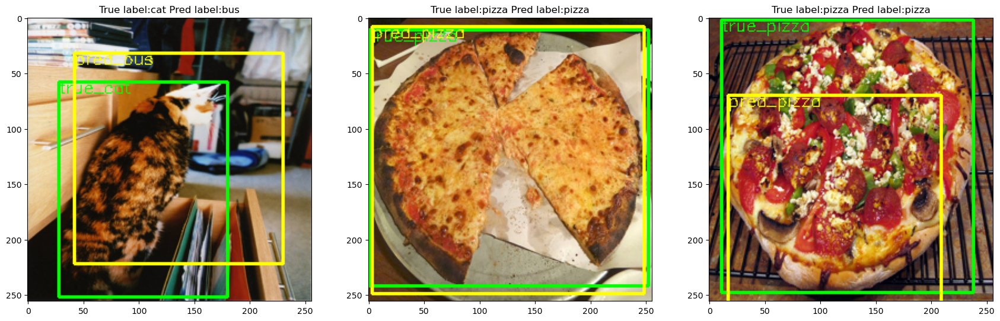

In [ ]:
check_show_image(net2)

In [ ]:
np.save("all_together_clf_net2.npy",all_together_clf_net2)
np.save("all_together_bbox_net2.npy",all_together_bbox_net2)
torch.save(net2 , 'CNN2_big_IoULoss')

## Comparison of regression from MSE Loss and IoU Loss

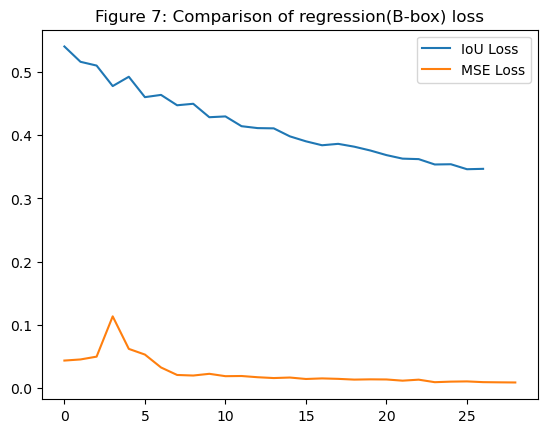

In [ ]:
plt.plot(all_together_bbox_net2[1:], label='IoU Loss')
plt.plot(all_together_bbox_net1[1:], label='MSE Loss')
plt.title(f"Figure {figure_num}: Comparison of regression(B-box) loss")
plt.legend()
figure_num+=1
plt.show()

## Discussion on the performance -




For just 15 epochs the network is giving good classification accuracy i.e around 86%. The mean IoU is about 0.5 for both MSE loss and CIoU loss.
It can be seen that the CIoU loss is decreasing constantly which is a good thing. Some things that can be done to increase the accuray of the model are -

- Train model with CIoU loss for more epochs
- Find correct learning rate that helps in converging the loss function and that too fast.
- Some pooling layers could have been added in between my residual blocks so as to decrease the number of parameters in the first fully connected layer.